<a href="https://colab.research.google.com/github/sayantan16/Deep-Learning-Tensorflow/blob/main/06_Transfer_Learning_in_Tensorflow_Part_3_Scaling_Up.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Transfer Learning with Tensorflow Part 3 - Scaling Up (Food Vision Mini)

## Imports and Functions

### Imports

In [50]:
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras.models import Sequential
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import random

### Functions

In [2]:
!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/extras/helper_functions.py

--2023-09-01 15:24:30--  https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/extras/helper_functions.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10246 (10K) [text/plain]
Saving to: ‘helper_functions.py’

helper_functions.py 100%[===================>]  10.01K  --.-KB/s    in 0s      

2023-09-01 15:24:30 (72.9 MB/s) - ‘helper_functions.py’ saved [10246/10246]



In [3]:
# Import series of helper functions for our notebook

from helper_functions import create_tensorboard_callback, plot_loss_curves, unzip_data, compare_historys, walk_through_dir

### 101 Food Classes: Working with less Data

In [4]:
!wget https://storage.googleapis.com/ztm_tf_course/food_vision/101_food_classes_10_percent.zip

unzip_data("101_food_classes_10_percent.zip")

train_dir = "101_food_classes_10_percent/train"
test_dir = "101_food_classes_10_percent/test"

--2023-09-01 15:24:31--  https://storage.googleapis.com/ztm_tf_course/food_vision/101_food_classes_10_percent.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.137.128, 142.250.101.128, 142.250.141.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.137.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1625420029 (1.5G) [application/zip]
Saving to: ‘101_food_classes_10_percent.zip’

101_food_classes_10 100%[===================>]   1.51G   102MB/s    in 14s     

2023-09-01 15:24:46 (110 MB/s) - ‘101_food_classes_10_percent.zip’ saved [1625420029/1625420029]



In [5]:
# How many images classes are there

walk_through_dir("101_food_classes_10_percent")

There are 2 directories and 0 images in '101_food_classes_10_percent'.
There are 101 directories and 0 images in '101_food_classes_10_percent/test'.
There are 0 directories and 250 images in '101_food_classes_10_percent/test/pizza'.
There are 0 directories and 250 images in '101_food_classes_10_percent/test/donuts'.
There are 0 directories and 250 images in '101_food_classes_10_percent/test/beet_salad'.
There are 0 directories and 250 images in '101_food_classes_10_percent/test/bread_pudding'.
There are 0 directories and 250 images in '101_food_classes_10_percent/test/seaweed_salad'.
There are 0 directories and 250 images in '101_food_classes_10_percent/test/churros'.
There are 0 directories and 250 images in '101_food_classes_10_percent/test/macarons'.
There are 0 directories and 250 images in '101_food_classes_10_percent/test/miso_soup'.
There are 0 directories and 250 images in '101_food_classes_10_percent/test/takoyaki'.
There are 0 directories and 250 images in '101_food_classes_1

In [6]:
# Setup Data inputs

import tensorflow as tf
IMG_SIZE = (224, 224)

train_data_all_10_percent = tf.keras.preprocessing.image_dataset_from_directory(train_dir,
                                                                                label_mode="categorical",
                                                                                image_size=IMG_SIZE)

test_data = tf.keras.preprocessing.image_dataset_from_directory(test_dir,
                                                                label_mode="categorical",
                                                                image_size=IMG_SIZE,
                                                                shuffle=False) # Dont shuffle the test data for prediction analysis

Found 7575 files belonging to 101 classes.
Found 25250 files belonging to 101 classes.


## Train a big dog model with transfer learning on 10% of 101 food classes

Some steps of the process:
1. Create a model checkpoint callback
2. Create a data augmentation layer to add it directly in the model
3. Build a headless (no top layers) Functional EfficientNetB0 backboned-model (we'll create our own output layer)
4. Compile our model
5. Feature extract for 5 full passes (5 epochs on the train dataset and validate on 15% of the test data, to save epoch time)

### Create Checkpoint Callback

In [7]:
checkpoint_path = "101_classes_10_percent_data_model_checkpoint"
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(checkpoint_path,
                                                         save_weights_only=True,
                                                         monitor="val_accuracy",
                                                         save_best_only=True)

### Create data augmentation layer

In [8]:
# Create data augmentation layer to incorporate it right into the model

from tensorflow.keras import layers
from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras.models import Sequential

# Setup data augmentation

data_augmentation = Sequential([
    preprocessing.RandomFlip("horizontal"),
    preprocessing.RandomRotation(0.2),
    preprocessing.RandomHeight(0.2),
    preprocessing.RandomWidth(0.2),
    preprocessing.RandomZoom(0.2),
    # preprocessing.Rescaling(1/255.) # rescale inputs of images to between 0 and 1, required for models like ResNet50
], name="data_augmentation")

### Build a headless (no top layers) Functional EfficientNetB0 backboned-model (we'll create our own output layer)

In [9]:
# Setup the base model and freeze its layers (this will extract features)

base_model = tf.keras.applications.EfficientNetB0(include_top=False)
base_model.trainable = False

# Setup model architecture with trainable top layers

inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
x = data_augmentation(inputs) # augment images, happens only in training phase
x = base_model(x, training=False) # put the base model in inference mode so weights which need to stay frozen are frozen
x = layers.GlobalAveragePooling2D(name="global_avg_pool_layer")(x)

output = layers.Dense(len(train_data_all_10_percent.class_names), activation="softmax", name="output_layer")(x)

model = tf.keras.Model(inputs, output)

16705208/16705208 [==============================] - 0s 0us/step


In [10]:
# Get the summary of the model

model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation (Sequenti  (None, None, None, 3)    0         
 al)                                                             
                                                                 
 efficientnetb0 (Functional)  (None, None, None, 1280)  4049571  
                                                                 
 global_avg_pool_layer (Glob  (None, 1280)             0         
 alAveragePooling2D)                                             
                                                                 
 output_layer (Dense)        (None, 101)               129381    
                                                                 
Total params: 4,178,952
Trainable params: 129,381
Non-trainab

### Compile the model

In [11]:
model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
              optimizer=tf.keras.optimizers.Adam(),
              metrics=["accuracy"])

### Feature extract for 5 full passes (5 epochs on the train dataset and validate on 15% of the test data, to save epoch time)

In [12]:
history_all_classes_10_percent = model.fit(train_data_all_10_percent,
                                           epochs=5,
                                           validation_data=test_data,
                                           validation_steps=int(0.15*len(test_data)),
                                           callbacks=[checkpoint_callback])

Epoch 1/5
237/237 [==============================] - 117s 434ms/step - loss: 3.3555 - accuracy: 0.2746 - val_loss: 2.5690 - val_accuracy: 0.4235
Epoch 2/5
237/237 [==============================] - 77s 324ms/step - loss: 2.1861 - accuracy: 0.5056 - val_loss: 2.1265 - val_accuracy: 0.4820
Epoch 3/5
237/237 [==============================] - 69s 285ms/step - loss: 1.8253 - accuracy: 0.5670 - val_loss: 1.9648 - val_accuracy: 0.5034
Epoch 4/5
237/237 [==============================] - 62s 262ms/step - loss: 1.5995 - accuracy: 0.6123 - val_loss: 1.8724 - val_accuracy: 0.5148
Epoch 5/5
237/237 [==============================] - 60s 248ms/step - loss: 1.4548 - accuracy: 0.6441 - val_loss: 1.8305 - val_accuracy: 0.5201


In [13]:
# Evaluate on the dataset

feature_extraction_results = model.evaluate(test_data)
feature_extraction_results

790/790 [==============================] - 64s 81ms/step - loss: 1.5801 - accuracy: 0.5850


[1.5800937414169312, 0.5850297212600708]

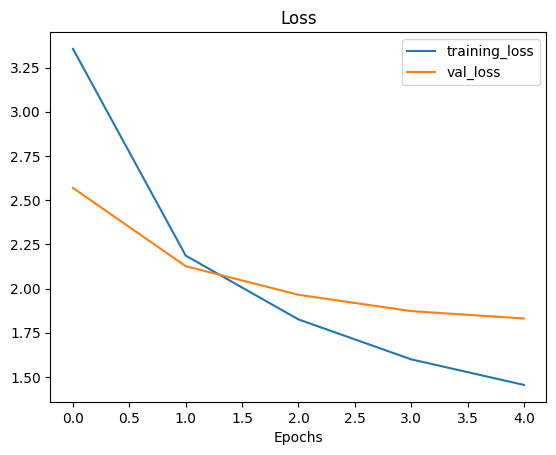

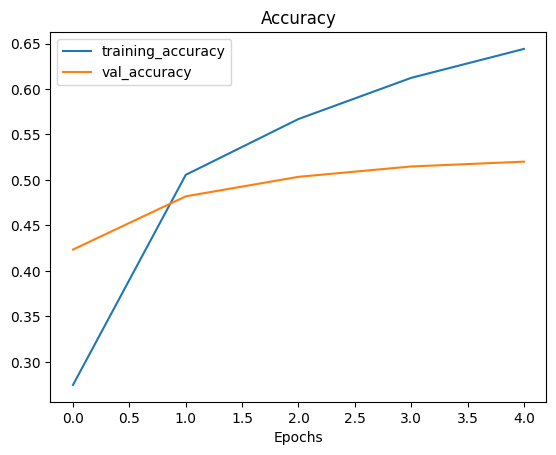

In [14]:
# Plot Loss Curves

plot_loss_curves(history=history_all_classes_10_percent)

If the 2 curves are not simillar, it may suggest that the model is overfitting ie, performing too well on the training data and not generalising on the unseen data.

## Fine-Tuning

In [15]:
# Unfreeze all the layers in the base model
base_model.trainable = True

# Refreeze every layer except the last 5
for layer in base_model.layers[:-5]:
  layer.trainable = False

The last few layers are chosen as they give fine-tuned training, ie it trains on the smallest sectors of the image rather than the 1st layers where the bigger elements are trained on.

Another thing to be reminded of is that, the learning rate is lowered by 10X the original learning rate of the base model, in this case = 0.0001

In [16]:
# recompile model with lower learning rate

model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
              optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
              metrics=["accuracy"])

In [17]:
# Layers in the model are trainable

for layer_number, layer in enumerate(model.layers):
  print(layer_number, layer.name, layer.trainable)

0 input_layer True
1 data_augmentation True
2 efficientnetb0 True
3 global_avg_pool_layer True
4 output_layer True


In [18]:
# layers that are trainable in the base model

for layer_number, layer in enumerate(model.layers[2].layers):
  print(layer_number, layer.name, layer.trainable)

0 input_1 False
1 rescaling False
2 normalization False
3 rescaling_1 False
4 stem_conv_pad False
5 stem_conv False
6 stem_bn False
7 stem_activation False
8 block1a_dwconv False
9 block1a_bn False
10 block1a_activation False
11 block1a_se_squeeze False
12 block1a_se_reshape False
13 block1a_se_reduce False
14 block1a_se_expand False
15 block1a_se_excite False
16 block1a_project_conv False
17 block1a_project_bn False
18 block2a_expand_conv False
19 block2a_expand_bn False
20 block2a_expand_activation False
21 block2a_dwconv_pad False
22 block2a_dwconv False
23 block2a_bn False
24 block2a_activation False
25 block2a_se_squeeze False
26 block2a_se_reshape False
27 block2a_se_reduce False
28 block2a_se_expand False
29 block2a_se_excite False
30 block2a_project_conv False
31 block2a_project_bn False
32 block2b_expand_conv False
33 block2b_expand_bn False
34 block2b_expand_activation False
35 block2b_dwconv False
36 block2b_bn False
37 block2b_activation False
38 block2b_se_squeeze False
39

In [19]:
# Fine tune for 5 more epochs

fine_tune_epochs = 10 # model has already done 5 epochs (feature extraction), this is the total number of epochs

# Fine tune our model

history_all_classes_10_percent_fine_tune = model.fit(train_data_all_10_percent,
                                                     epochs=fine_tune_epochs,
                                                     validation_data=test_data,
                                                     validation_steps=int(0.15*len(test_data)),
                                                     initial_epoch=history_all_classes_10_percent.epoch[-1])

Epoch 5/10
237/237 [==============================] - 69s 246ms/step - loss: 1.2248 - accuracy: 0.6795 - val_loss: 1.7638 - val_accuracy: 0.5363
Epoch 6/10
237/237 [==============================] - 55s 231ms/step - loss: 1.0946 - accuracy: 0.7126 - val_loss: 1.7556 - val_accuracy: 0.5360
Epoch 7/10
237/237 [==============================] - 49s 205ms/step - loss: 1.0092 - accuracy: 0.7344 - val_loss: 1.7535 - val_accuracy: 0.5379
Epoch 8/10
237/237 [==============================] - 52s 216ms/step - loss: 0.9321 - accuracy: 0.7530 - val_loss: 1.7528 - val_accuracy: 0.5421
Epoch 9/10
237/237 [==============================] - 51s 213ms/step - loss: 0.8798 - accuracy: 0.7653 - val_loss: 1.7625 - val_accuracy: 0.5413
Epoch 10/10
237/237 [==============================] - 49s 204ms/step - loss: 0.8292 - accuracy: 0.7745 - val_loss: 1.7754 - val_accuracy: 0.5421


In [20]:
# Evaluate on the whole data

all_classes_10_percent_fine_tune_results = model.evaluate(test_data)
all_classes_10_percent_fine_tune_results

790/790 [==============================] - 72s 91ms/step - loss: 1.5200 - accuracy: 0.6000


[1.5199558734893799, 0.5999603867530823]

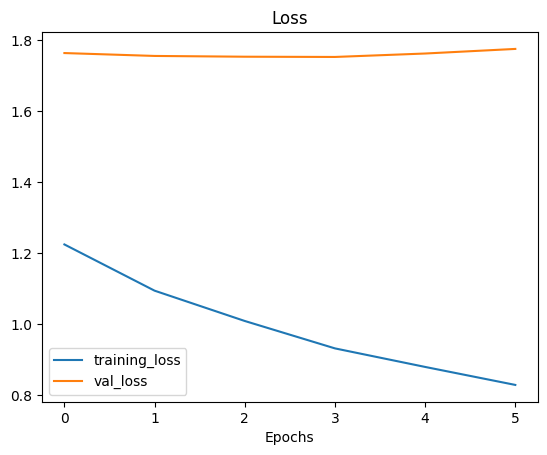

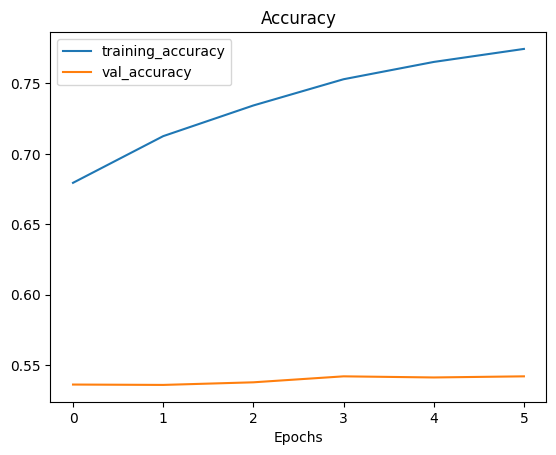

In [21]:
# Plot loss curves

plot_loss_curves(history=history_all_classes_10_percent_fine_tune)

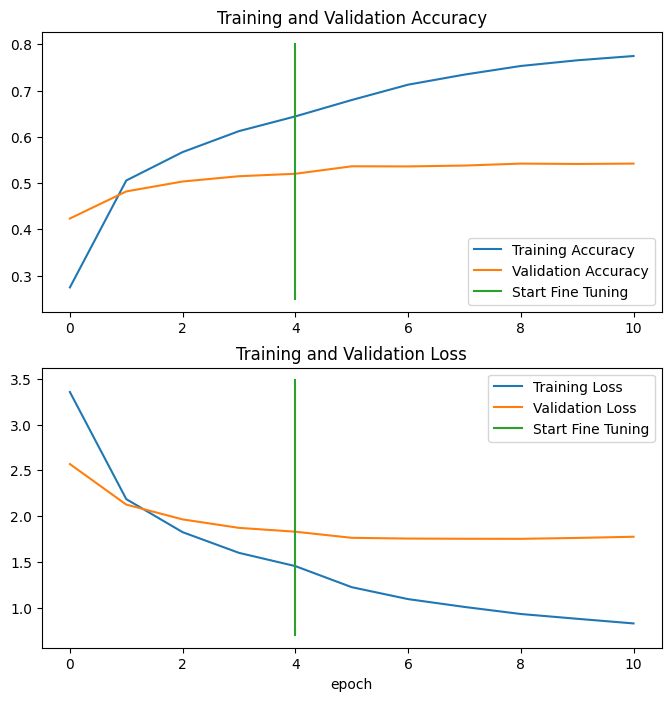

In [22]:
# Compare the histories of feature extraction model with fine-tuning model

compare_historys(original_history=history_all_classes_10_percent,
                 new_history=history_all_classes_10_percent_fine_tune,
                 initial_epochs=5)

## Saving and Loading our model

To save our model in an external application, we have to save and load our model

In [23]:
# # Save our fine-tuned model
# !pip install pyyaml h5py  # Required to save models in HDF5 format

# model.save("101_food_classes_10_percent_saved_model.h5")

In [24]:
# Load and evaluate the saved model

# model = tf.keras.load_model("drive/MyDrive/Tensorflow/101_food_classes_10_percent_saved_model")

## Evaluating the Performance of the model across all different classes
Finding out which prediction are most wrong

In [25]:
import tensorflow as tf

# Download pretrained model, so all predictions are similar
!wget https://storage.googleapis.com/ztm_tf_course/food_vision/06_101_food_class_10_percent_saved_big_dog_model.zip

--2023-09-01 15:39:53--  https://storage.googleapis.com/ztm_tf_course/food_vision/06_101_food_class_10_percent_saved_big_dog_model.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 142.251.2.128, 74.125.137.128, 142.250.101.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.251.2.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 46760742 (45M) [application/zip]
Saving to: ‘06_101_food_class_10_percent_saved_big_dog_model.zip’

06_101_food_class_1 100%[===================>]  44.59M  83.1MB/s    in 0.5s    

2023-09-01 15:39:53 (83.1 MB/s) - ‘06_101_food_class_10_percent_saved_big_dog_model.zip’ saved [46760742/46760742]



In [26]:
unzip_data("/content/06_101_food_class_10_percent_saved_big_dog_model.zip")

In [27]:
# Load in saved model

model = tf.keras.models.load_model("/content/06_101_food_class_10_percent_saved_big_dog_model")

In [28]:
# Evaluate loaded model

results_downloaded_model = model.evaluate(test_data)
results_downloaded_model

790/790 [==============================] - 73s 91ms/step - loss: 1.8027 - accuracy: 0.6078


[1.8027206659317017, 0.6077623963356018]

## Making predictions with our trained model

In [29]:
# make predictions with model

preds_probs = model.predict(test_data, verbose=1) # set verbose to see how long is left

790/790 [==============================] - 70s 87ms/step


In [30]:
# How many predictions are there?
len(preds_probs)

25250

In [31]:
# Whats the shape of our predictions?
preds_probs.shape

(25250, 101)

In [32]:
# Lets see what the 1st 10 poredictions look like

preds_probs[:10]

array([[5.9542079e-02, 3.5742114e-06, 4.1377071e-02, ..., 1.4138705e-09,
        8.3530424e-05, 3.0897493e-03],
       [9.6401680e-01, 1.3753272e-09, 8.4780494e-04, ..., 5.4286946e-05,
        7.8362065e-12, 9.8466024e-10],
       [9.5925868e-01, 3.2533771e-05, 1.4867012e-03, ..., 7.1891407e-07,
        5.4397475e-07, 4.0276118e-05],
       ...,
       [4.7313249e-01, 1.2931206e-07, 1.4805582e-03, ..., 5.9750117e-04,
        6.6969209e-05, 2.3469403e-05],
       [4.4571843e-02, 4.7265397e-07, 1.2258503e-01, ..., 6.3498451e-06,
        7.5318876e-06, 3.6778769e-03],
       [7.2438902e-01, 1.9249717e-09, 5.2310897e-05, ..., 1.2291410e-03,
        1.5792732e-09, 9.6395481e-05]], dtype=float32)

In [33]:
# What does the 1st prediction probability look like

preds_probs[0], len(preds_probs[0])

(array([5.9542079e-02, 3.5742114e-06, 4.1377071e-02, 1.0660534e-09,
        8.1614422e-09, 8.6639478e-09, 8.0927344e-07, 8.5652732e-07,
        1.9859108e-05, 8.0977674e-07, 3.1727800e-09, 9.8673911e-07,
        2.8532281e-04, 7.8048890e-10, 7.4230117e-04, 3.8916227e-05,
        6.4740480e-06, 2.4977348e-06, 3.7891161e-05, 2.0678284e-07,
        1.5538406e-05, 8.1507324e-07, 2.6230616e-06, 2.0010684e-07,
        8.3827518e-07, 5.4215925e-06, 3.7390960e-06, 1.3150530e-08,
        2.7761441e-03, 2.8051916e-05, 6.8562017e-10, 2.5574853e-05,
        1.6688927e-04, 7.6406986e-10, 4.0452811e-04, 1.3150683e-08,
        1.7957391e-06, 1.4448174e-06, 2.3062844e-02, 8.2466693e-07,
        8.5365679e-07, 1.7138593e-06, 7.0525425e-06, 1.8402130e-08,
        2.8553373e-07, 7.9483443e-06, 2.0681530e-06, 1.8525149e-07,
        3.3619703e-08, 3.1522504e-04, 1.0410941e-05, 8.5448431e-07,
        8.4741855e-01, 1.0555424e-05, 4.4094787e-07, 3.7404032e-05,
        3.5306188e-05, 3.2488941e-05, 6.7314730e

In [34]:
# We get one prediction probability per class

print(f"Number of prediction probabilities for sample 0: {len(preds_probs[0])}")
print(f"what prediction probability sample 0 looks like: \n {preds_probs[0]}")
print(f"The class with the highest predicted probability by the model for sample 0: {preds_probs[0].argmax()}")

Number of prediction probabilities for sample 0: 101
what prediction probability sample 0 looks like: 
 [5.9542079e-02 3.5742114e-06 4.1377071e-02 1.0660534e-09 8.1614422e-09
 8.6639478e-09 8.0927344e-07 8.5652732e-07 1.9859108e-05 8.0977674e-07
 3.1727800e-09 9.8673911e-07 2.8532281e-04 7.8048890e-10 7.4230117e-04
 3.8916227e-05 6.4740480e-06 2.4977348e-06 3.7891161e-05 2.0678284e-07
 1.5538406e-05 8.1507324e-07 2.6230616e-06 2.0010684e-07 8.3827518e-07
 5.4215925e-06 3.7390960e-06 1.3150530e-08 2.7761441e-03 2.8051916e-05
 6.8562017e-10 2.5574853e-05 1.6688927e-04 7.6406986e-10 4.0452811e-04
 1.3150683e-08 1.7957391e-06 1.4448174e-06 2.3062844e-02 8.2466693e-07
 8.5365679e-07 1.7138593e-06 7.0525425e-06 1.8402130e-08 2.8553373e-07
 7.9483443e-06 2.0681530e-06 1.8525149e-07 3.3619703e-08 3.1522504e-04
 1.0410941e-05 8.5448431e-07 8.4741855e-01 1.0555424e-05 4.4094787e-07
 3.7404032e-05 3.5306188e-05 3.2488941e-05 6.7314730e-05 1.2852589e-08
 2.6219654e-10 1.0318089e-05 8.5743537e-05 1

In [35]:
# Get the pred classes of each label

pred_classes = preds_probs.argmax(axis=1)

# how do they look?

pred_classes[:10]

array([52,  0,  0, 80, 79, 61, 29,  0, 85,  0])

In [36]:
# To get our test labels, we need to unravel our test_data BatchDataset

y_labels = []
for images, labels in test_data.unbatch():
  y_labels.append(labels.numpy().argmax())
y_labels[:10] # Look at the 1st 10

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

## Evaluating our model's predictions

one way to check our model's predictions array is in the same order as out test labels array

In [37]:
results_downloaded_model

[1.8027206659317017, 0.6077623963356018]

In [38]:
# Lets try scikit learn's accuracy score function and see what it comes up with

from sklearn.metrics import accuracy_score
sklearn_accuracy = accuracy_score(y_true=y_labels,
                                  y_pred=pred_classes)

sklearn_accuracy

0.6077623762376237

In [39]:
# Does this metric come close to our model's evaluate results

import numpy as np
np.isclose(results_downloaded_model[1], sklearn_accuracy)

True

## Making a Confusion Matrix

In [40]:
# Get a list of class names

class_names = test_data.class_names
class_names

['apple_pie',
 'baby_back_ribs',
 'baklava',
 'beef_carpaccio',
 'beef_tartare',
 'beet_salad',
 'beignets',
 'bibimbap',
 'bread_pudding',
 'breakfast_burrito',
 'bruschetta',
 'caesar_salad',
 'cannoli',
 'caprese_salad',
 'carrot_cake',
 'ceviche',
 'cheese_plate',
 'cheesecake',
 'chicken_curry',
 'chicken_quesadilla',
 'chicken_wings',
 'chocolate_cake',
 'chocolate_mousse',
 'churros',
 'clam_chowder',
 'club_sandwich',
 'crab_cakes',
 'creme_brulee',
 'croque_madame',
 'cup_cakes',
 'deviled_eggs',
 'donuts',
 'dumplings',
 'edamame',
 'eggs_benedict',
 'escargots',
 'falafel',
 'filet_mignon',
 'fish_and_chips',
 'foie_gras',
 'french_fries',
 'french_onion_soup',
 'french_toast',
 'fried_calamari',
 'fried_rice',
 'frozen_yogurt',
 'garlic_bread',
 'gnocchi',
 'greek_salad',
 'grilled_cheese_sandwich',
 'grilled_salmon',
 'guacamole',
 'gyoza',
 'hamburger',
 'hot_and_sour_soup',
 'hot_dog',
 'huevos_rancheros',
 'hummus',
 'ice_cream',
 'lasagna',
 'lobster_bisque',
 'lobster

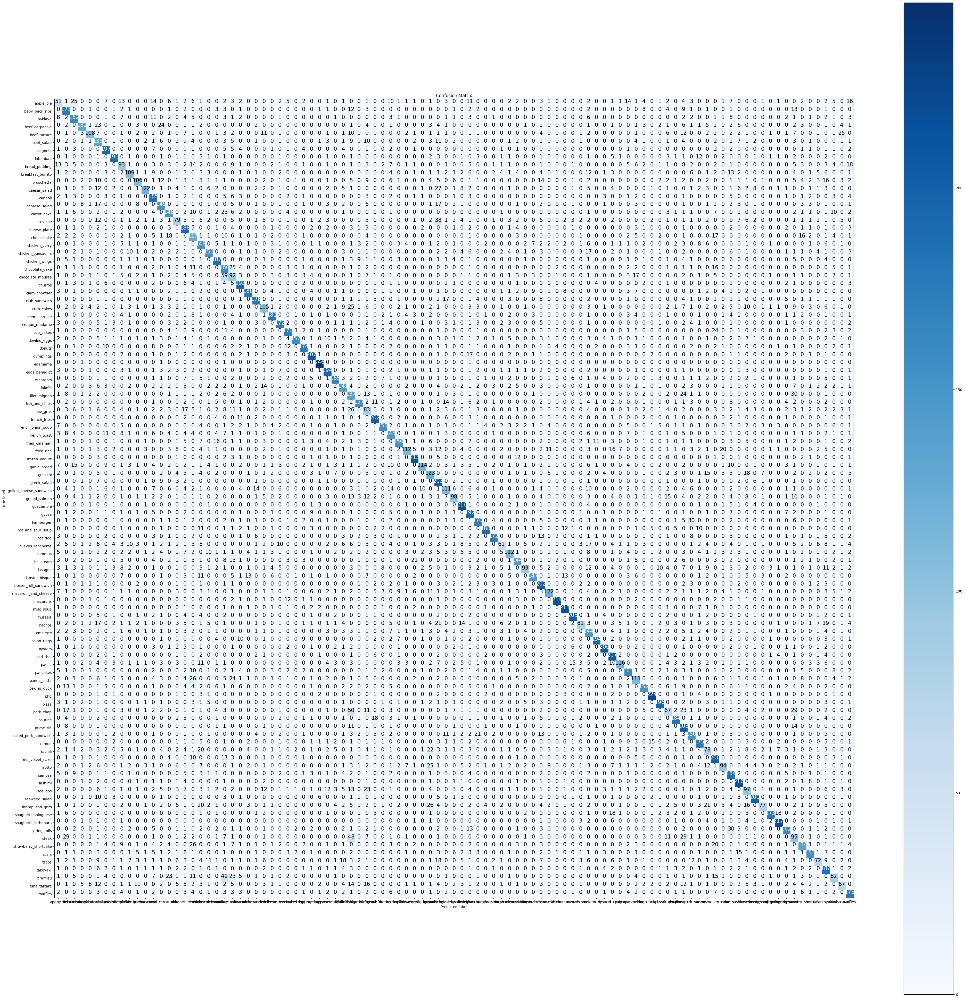

In [41]:
from helper_functions import make_confusion_matrix

make_confusion_matrix(y_true=y_labels,
                      y_pred=pred_classes,
                      classes=class_names,
                      figsize=(50, 50))

## Classification Report

Scikit-Learn has a helpful function for acquiring many different classification metrics per class (eg - precision, recall and F1) called Classification Report

In [42]:
from sklearn.metrics import classification_report
print(classification_report(y_true=y_labels,
                            y_pred=pred_classes))

              precision    recall  f1-score   support

           0       0.29      0.20      0.24       250
           1       0.51      0.69      0.59       250
           2       0.56      0.65      0.60       250
           3       0.74      0.53      0.62       250
           4       0.73      0.43      0.54       250
           5       0.34      0.54      0.42       250
           6       0.67      0.79      0.72       250
           7       0.82      0.76      0.79       250
           8       0.40      0.37      0.39       250
           9       0.62      0.44      0.51       250
          10       0.62      0.42      0.50       250
          11       0.84      0.49      0.62       250
          12       0.52      0.74      0.61       250
          13       0.56      0.60      0.58       250
          14       0.56      0.59      0.57       250
          15       0.44      0.32      0.37       250
          16       0.45      0.75      0.57       250
          17       0.37    

In [43]:
# Get a dictionary of the classification report

classification_report_dict = classification_report(y_labels, pred_classes, output_dict=True)
classification_report_dict

{'0': {'precision': 0.29310344827586204,
  'recall': 0.204,
  'f1-score': 0.24056603773584903,
  'support': 250},
 '1': {'precision': 0.5088235294117647,
  'recall': 0.692,
  'f1-score': 0.5864406779661017,
  'support': 250},
 '2': {'precision': 0.5625,
  'recall': 0.648,
  'f1-score': 0.6022304832713754,
  'support': 250},
 '3': {'precision': 0.7415730337078652,
  'recall': 0.528,
  'f1-score': 0.616822429906542,
  'support': 250},
 '4': {'precision': 0.7346938775510204,
  'recall': 0.432,
  'f1-score': 0.544080604534005,
  'support': 250},
 '5': {'precision': 0.34177215189873417,
  'recall': 0.54,
  'f1-score': 0.41860465116279066,
  'support': 250},
 '6': {'precision': 0.6677966101694915,
  'recall': 0.788,
  'f1-score': 0.7229357798165138,
  'support': 250},
 '7': {'precision': 0.8197424892703863,
  'recall': 0.764,
  'f1-score': 0.7908902691511386,
  'support': 250},
 '8': {'precision': 0.4025974025974026,
  'recall': 0.372,
  'f1-score': 0.3866943866943867,
  'support': 250},
 '9

### Lets plot all of our classes f1-scores

In [44]:
# Create empty dictionary
class_f1_scores = {}

# Loop through classification report dictionary items
for k, v in classification_report_dict.items():
  if k == "accuracy": # stop once we get to accuracy key
    break
  else:
    # Add class names and f-1 scores to new dictionary
    class_f1_scores[class_names[int(k)]] = v["f1-score"]

class_f1_scores

{'apple_pie': 0.24056603773584903,
 'baby_back_ribs': 0.5864406779661017,
 'baklava': 0.6022304832713754,
 'beef_carpaccio': 0.616822429906542,
 'beef_tartare': 0.544080604534005,
 'beet_salad': 0.41860465116279066,
 'beignets': 0.7229357798165138,
 'bibimbap': 0.7908902691511386,
 'bread_pudding': 0.3866943866943867,
 'breakfast_burrito': 0.5117370892018779,
 'bruschetta': 0.5047619047619047,
 'caesar_salad': 0.6161616161616161,
 'cannoli': 0.6105610561056106,
 'caprese_salad': 0.5775193798449612,
 'carrot_cake': 0.574757281553398,
 'ceviche': 0.36744186046511623,
 'cheese_plate': 0.5654135338345864,
 'cheesecake': 0.42546063651591287,
 'chicken_curry': 0.5008403361344538,
 'chicken_quesadilla': 0.6411889596602972,
 'chicken_wings': 0.7123809523809523,
 'chocolate_cake': 0.45261669024045265,
 'chocolate_mousse': 0.3291592128801431,
 'churros': 0.7134935304990757,
 'clam_chowder': 0.7708779443254817,
 'club_sandwich': 0.734020618556701,
 'crab_cakes': 0.4625550660792952,
 'creme_brulee

In [45]:
# Turn f1 scores into dataframes for visualization

import pandas as pd
f1_scores = pd.DataFrame({"class_names" : list(class_f1_scores.keys()),
                          "f1-score" : list(class_f1_scores.values())}).sort_values("f1-score", ascending=False)

In [46]:
f1_scores

,class_names,f1-score
33,edamame,0.937143
63,macarons,0.895397
75,pho,0.866538
91,spaghetti_carbonara,0.847656
69,oysters,0.834008
...,...,...
56,huevos_rancheros,0.339833
22,chocolate_mousse,0.329159
77,pork_chop,0.308756
39,foie_gras,0.297491


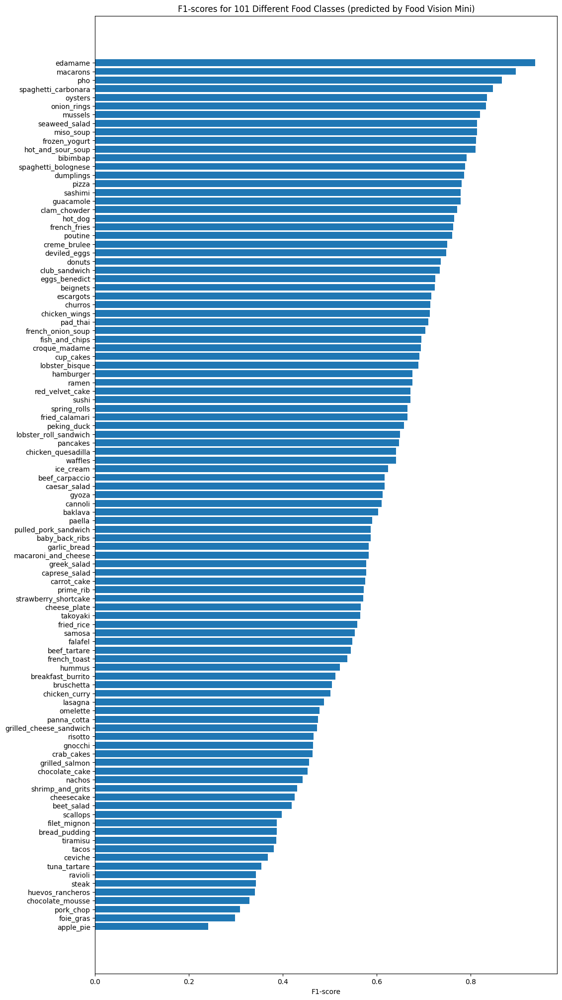

In [47]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(12,25))
scores = ax.barh(range(len(f1_scores)), f1_scores["f1-score"].values) # get f1 score values
ax.set_yticks(range(len(f1_scores)))
ax.set_yticklabels(f1_scores["class_names"]);
ax.set_xlabel("F1-score")
ax.set_title("F1-scores for 101 Different Food Classes (predicted by Food Vision Mini)")
ax.invert_yaxis(); # reverse the order of our plot

# Visualizing predictions on Custom Images

to visualize the model's predicitons on our own images, we will need a function to load and preprocess images, it will need to:

1. Read in a target image filepath using tf.io.read_file()
2. Turns the image into a tensor using tf.io.decode_image()
3. Resize the image tensor to be the same size as the images our model has trained on using tf.image.resize()
4. Scale the image to get all the pixel values between 0 & 1 (if necessary)

## Create a function to load and prepare images

In [48]:
def load_and_prep_image(filename, img_shape=224, scale=True):
  """
  Read in an image from filename, turns it into a tensor and reshapes into specified shape (img_shape, img_shape, color_channels = 3)

  Args:
    filename (str): path to target image
    image_shape (int): height/width dimension of target image size
    scale (bool): scale pixel values from 0-255 to 0-1 or not

  Returns:
    Image tensor of shape (img_shape, img_shape, 3)
  """

  # Read in the image
  img = tf.io.read_file(filename)

  # Decode image into tensor
  img = tf.io.decode_image(img, channels=3)

  # Resize the image
  img = tf.image.resize(img, [img_shape, img_shape])

  # Scale? Yes/No
  if scale:
    # Rescale the image, get all values between 0 and 1
    return img/255.
  else:
    return img # dont need to rescale for EfficientNet models in Tensorflow

### Now we have got function to load and prepare target images, lets now write some code to visualize images, their target label and our model's predictions.

Specifically, we will write code to:
1. Load a few random images from the test dataset
2. Make predictions on the loaded images
3. Plot the original images along with the model's predicitons, prediction probability and truth label

1/1 [==============================] - 0s 46ms/step


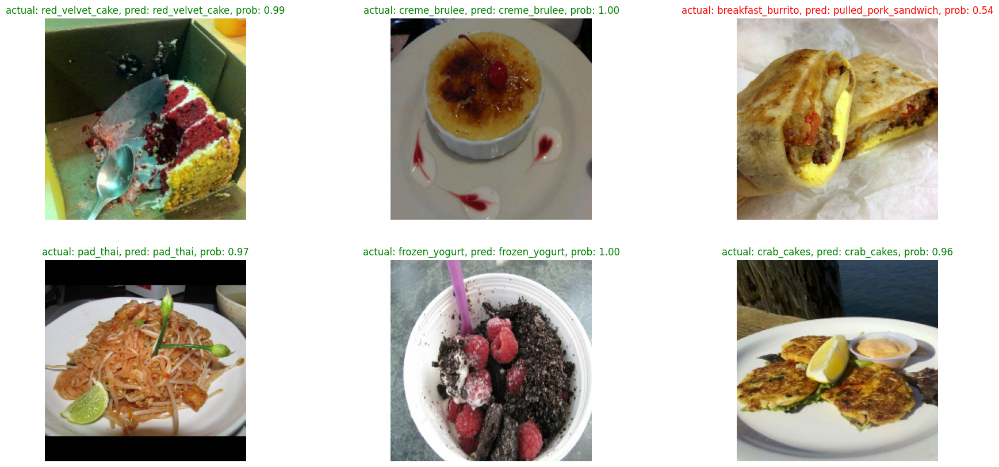

In [71]:
# Make preds on a series of random images
import os
import random

plt.figure(figsize=(22, 10))
for i in range(6):
  # choose a random image from a random class
  class_name = random.choice(class_names)
  filename = random.choice(os.listdir(test_dir + "/" + class_name))
  filepath = test_dir + "/" + class_name + "/" + filename
  # print(filepath)

  # Load an image and make predictions
  img = load_and_prep_image(filepath, scale=False)
  # print(img.shape)
  # print(train_data_all_10_percent)
  img_expanded = tf.expand_dims(img, axis=0)
  pred_prob = model.predict(img_expanded) # get prediction probabilities array
  pred_class = class_names[pred_prob.argmax()] # get highest prediction probability index and match it to class names list
  # print(pred_prob)
  # print(pred_class)

  # Plot the images
  plt.subplot(2, 3, i+1)
  plt.imshow(img/255.)
  if class_name == pred_class: # if predicted class matches truth class, make text green
    title_color = "g"
  else:
    title_color = "r"
  plt.title(f"actual: {class_name}, pred: {pred_class}, prob: {pred_prob.max():.2f}", c = title_color)
  plt.axis(False)

# Finding the most wrong predictions

To find out where our model is most wrong, lets write some code to find out the following:

1. Get all of the image file paths in the test dataset using list_files() method
2. Create a pandas DataFrame of the image filepaths, ground truth labels, predicted classes (from our models), max prediction probabilities, prediction class names and ground truth class names.
3. Use our DataFrame to find all the wrong predictions (where the ground truth label doesn't match the predictions).
4. Sort the DataFrame based on wrong predictions (have the highest prediction probabilities at the top).
5. Visualize the images with the highest prediction probabilities but have the wrong predictions.

In [73]:
# Step 1

# Get all the image file paths in the test data set
filepaths = []
for filepath in test_data.list_files("/content/101_food_classes_10_percent/test/*/*.jpg",
                                     shuffle=False):
  filepaths.append(filepath.numpy())
filepaths[:10]

[b'/content/101_food_classes_10_percent/test/apple_pie/1011328.jpg',
 b'/content/101_food_classes_10_percent/test/apple_pie/101251.jpg',
 b'/content/101_food_classes_10_percent/test/apple_pie/1034399.jpg',
 b'/content/101_food_classes_10_percent/test/apple_pie/103801.jpg',
 b'/content/101_food_classes_10_percent/test/apple_pie/1038694.jpg',
 b'/content/101_food_classes_10_percent/test/apple_pie/1047447.jpg',
 b'/content/101_food_classes_10_percent/test/apple_pie/1068632.jpg',
 b'/content/101_food_classes_10_percent/test/apple_pie/110043.jpg',
 b'/content/101_food_classes_10_percent/test/apple_pie/1106961.jpg',
 b'/content/101_food_classes_10_percent/test/apple_pie/1113017.jpg']

In [75]:
# Step 2

# Create a DataFrame of different parameters for each of our test images
import pandas as pd
pred_df = pd.DataFrame({"img_path": filepaths,
                        "y_true": y_labels,
                        "y_pred": pred_classes,
                        "pred_conf": preds_probs.max(axis=1), # get the maximum prediction probability value
                        "y_true_className": [class_names[i] for i in y_labels],
                        "y_pred_className": [class_names[i] for i in pred_classes]})
pred_df

,img_path,y_true,y_pred,pred_conf,y_true_className,y_pred_className
0,b'/content/101_food_classes_10_percent/test/ap...,0,52,0.847419,apple_pie,gyoza
1,b'/content/101_food_classes_10_percent/test/ap...,0,0,0.964017,apple_pie,apple_pie
2,b'/content/101_food_classes_10_percent/test/ap...,0,0,0.959259,apple_pie,apple_pie
3,b'/content/101_food_classes_10_percent/test/ap...,0,80,0.658606,apple_pie,pulled_pork_sandwich
4,b'/content/101_food_classes_10_percent/test/ap...,0,79,0.367900,apple_pie,prime_rib
...,...,...,...,...,...,...
25245,b'/content/101_food_classes_10_percent/test/wa...,100,100,0.972823,waffles,waffles
25246,b'/content/101_food_classes_10_percent/test/wa...,100,16,0.878028,waffles,cheese_plate
25247,b'/content/101_food_classes_10_percent/test/wa...,100,100,0.537899,waffles,waffles
25248,b'/content/101_food_classes_10_percent/test/wa...,100,94,0.501949,waffles,strawberry_shortcake


In [76]:
# Step 3

# Find out in our DataFrame which predictions are wrong
pred_df["pred_correct"] = pred_df["y_true"] == pred_df["y_pred"]
pred_df.head()

,img_path,y_true,y_pred,pred_conf,y_true_className,y_pred_className,pred_correct
0,b'/content/101_food_classes_10_percent/test/ap...,0,52,0.847419,apple_pie,gyoza,False
1,b'/content/101_food_classes_10_percent/test/ap...,0,0,0.964017,apple_pie,apple_pie,True
2,b'/content/101_food_classes_10_percent/test/ap...,0,0,0.959259,apple_pie,apple_pie,True
3,b'/content/101_food_classes_10_percent/test/ap...,0,80,0.658606,apple_pie,pulled_pork_sandwich,False
4,b'/content/101_food_classes_10_percent/test/ap...,0,79,0.367900,apple_pie,prime_rib,False


In [78]:
# Step 4

# Sort out or DataFrame to have the most wrong predictions on the top
top_100_wrong = pred_df[pred_df["pred_correct"] == False].sort_values("pred_conf", ascending=False)[:100]
top_100_wrong.head(20)

,img_path,y_true,y_pred,pred_conf,y_true_className,y_pred_className,pred_correct
21810,b'/content/101_food_classes_10_percent/test/sc...,87,29,0.999997,scallops,cup_cakes,False
231,b'/content/101_food_classes_10_percent/test/ap...,0,100,0.999995,apple_pie,waffles,False
15359,b'/content/101_food_classes_10_percent/test/lo...,61,53,0.999988,lobster_roll_sandwich,hamburger,False
23539,b'/content/101_food_classes_10_percent/test/st...,94,83,0.999987,strawberry_shortcake,red_velvet_cake,False
21400,b'/content/101_food_classes_10_percent/test/sa...,85,92,0.999981,samosa,spring_rolls,False
24540,b'/content/101_food_classes_10_percent/test/ti...,98,83,0.999947,tiramisu,red_velvet_cake,False
2511,b'/content/101_food_classes_10_percent/test/br...,10,61,0.999945,bruschetta,lobster_roll_sandwich,False
5574,b'/content/101_food_classes_10_percent/test/ch...,22,21,0.999939,chocolate_mousse,chocolate_cake,False
17855,b'/content/101_food_classes_10_percent/test/pa...,71,65,0.999931,paella,mussels,False
23797,b'/content/101_food_classes_10_percent/test/su...,95,86,0.999904,sushi,sashimi,False


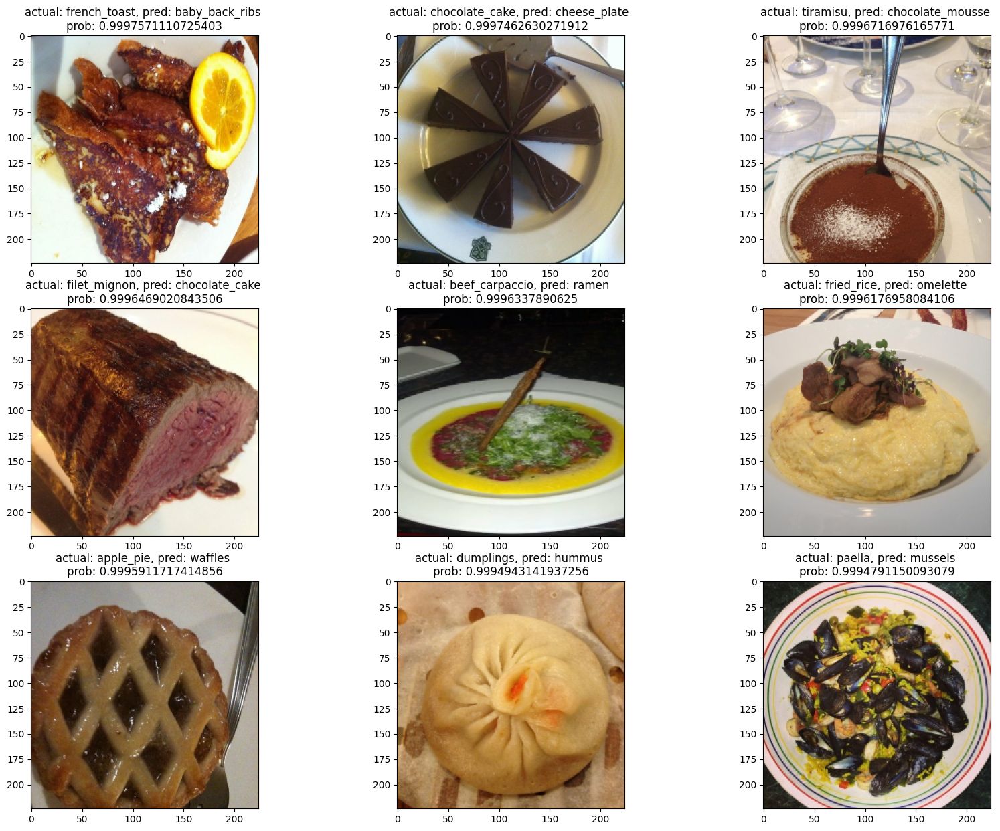

In [94]:
# Step 5

# Visualize the test data samples which have the wrong predcition but the highest pred probability
images_to_view = 9
start_index = 20

plt.figure(figsize=(20, 15))
for i, row in enumerate(top_100_wrong[start_index:start_index+images_to_view].itertuples()):
  # print(row)
  plt.subplot(3, 3, i+1)
  img = load_and_prep_image(row[1], scale=False)
  _, _, _, _, pred_prob, y_true_className, y_pred_className, _ = row # only interested in a few parameters in each row
  plt.imshow(img/255.)
  plt.title(f"actual: {y_true_className}, pred: {y_pred_className} \nprob: {pred_prob}")

# Test the model on our owm custom images

In [101]:
# Get the custom food images filepaths

custom_food_images = ["/content/drive/MyDrive/Colab Notebooks/Images/" + img_path for img_path in os.listdir("/content/drive/MyDrive/Colab Notebooks/Images")]
custom_food_images

['/content/drive/MyDrive/Colab Notebooks/Images/Pizza_sample_1.jpeg',
 '/content/drive/MyDrive/Colab Notebooks/Images/Pizza_sample_2.jpeg',
 '/content/drive/MyDrive/Colab Notebooks/Images/ice_cream_sample_1.jpeg',
 '/content/drive/MyDrive/Colab Notebooks/Images/chicken_wings_sample_1.jpeg',
 '/content/drive/MyDrive/Colab Notebooks/Images/fried_rice_sample_1.jpeg',
 '/content/drive/MyDrive/Colab Notebooks/Images/chicken_curry_sample_1.jpeg',
 '/content/drive/MyDrive/Colab Notebooks/Images/cheese_sample_1.jpeg',
 '/content/drive/MyDrive/Colab Notebooks/Images/fajita_sample_1.jpeg',
 '/content/drive/MyDrive/Colab Notebooks/Images/puff_pastry_sample_1.jpeg',
 '/content/drive/MyDrive/Colab Notebooks/Images/pasta_sample_1.jpeg',
 '/content/drive/MyDrive/Colab Notebooks/Images/pasta_sample_2.jpeg',
 '/content/drive/MyDrive/Colab Notebooks/Images/lasagna_sample_1.jpeg',
 '/content/drive/MyDrive/Colab Notebooks/Images/hotdog_sample_1.jpeg',
 '/content/drive/MyDrive/Colab Notebooks/Images/food_s

1/1 [==============================] - 0s 27ms/step


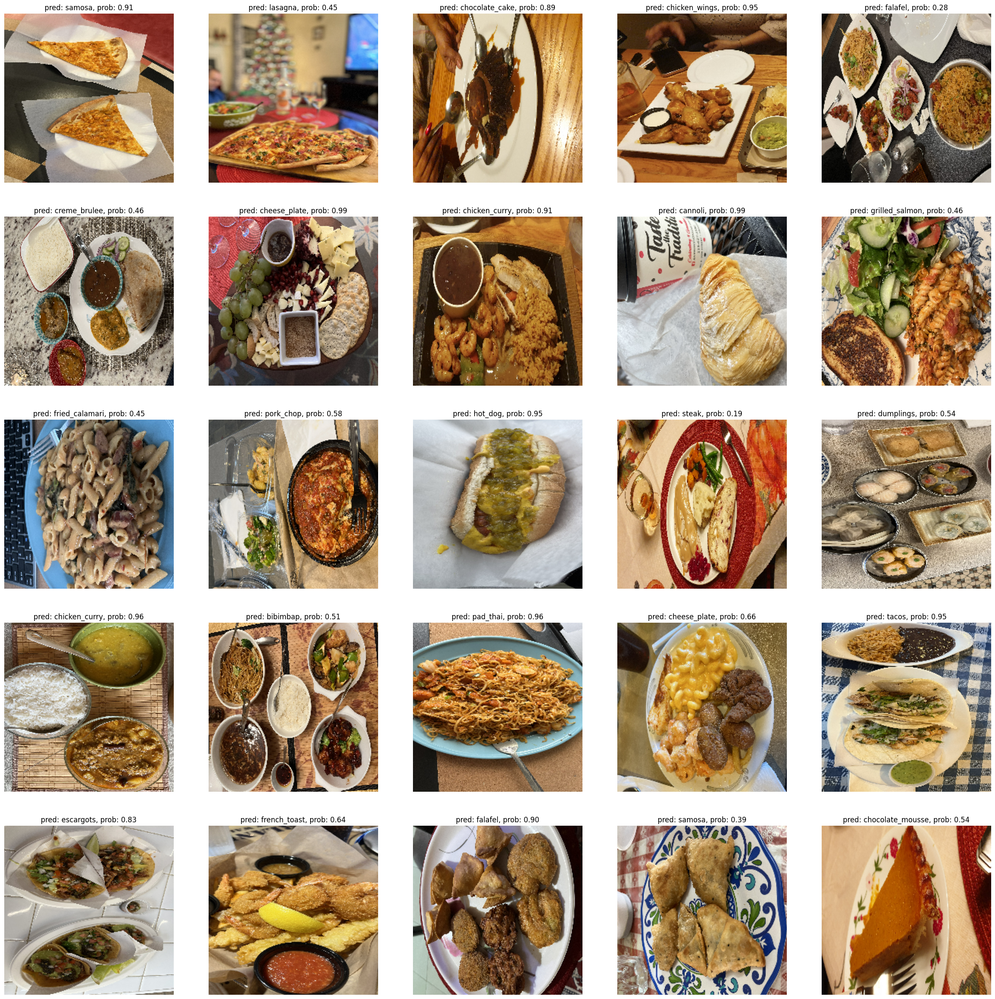

In [114]:
# Make predictions on and plot custom food images
count = len(custom_food_images)
plt.figure(figsize=(30, 30))

for i in range(count):

  plt.subplot(5, 5, i+1)

  img = load_and_prep_image(custom_food_images[i], scale=False) # dont need to scale for EfficientNetB0 model
  pred_prob = model.predict(tf.expand_dims(img, axis=0)) # make predictions on image with shape (1, 224, 224, 3) same shape as the model was trained on
  pred_class = class_names[pred_prob.argmax()] # get the index with the highest probability

  # plot the appropriate information
  plt.imshow(img/255.)
  plt.title(f"pred: {pred_class}, prob: {pred_prob.max():.2f}")
  plt.axis(False)